## Bluring and Smoothing 
Often bending and smoothing is combined with edge detection

Edge detection algorithms detect too many edges when shown a high resolution image without any blurring.

**Methods we will be exploring**

* Gamma Correction:
    
    Gamma Correction can be applied to an image to make it appear brighter or darker depending on the gamma value choosen
    
* Kernel Based Filters:
    
    kernels can be applied over an image to produce a variety of effects
    
    


In [1]:
# Import all the tools
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# creating two functtions
def load_img():
    img=cv2.imread('bricks.jpg').astype(np.float32)/255
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

def display_img(img):
    fig=plt.figure(figsize=(10,15))
    ax=fig.add_subplot(111)
    ax.imshow(img,cmap='gray')


In [5]:
brick_img=load_img()

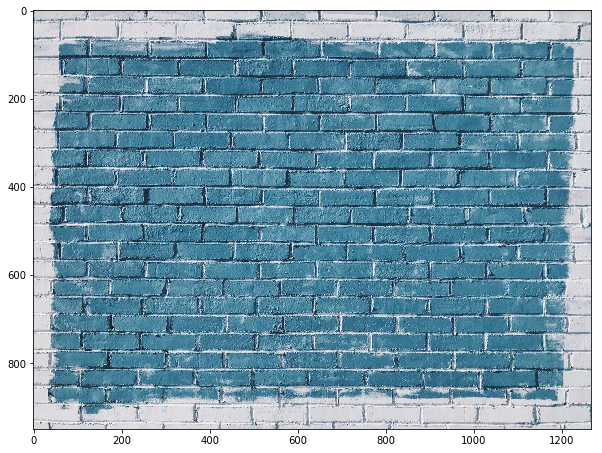

In [6]:
display_img(brick_img)

### Gamma Correction: Practical Effect of increasing brightness

In [11]:

gamma=1/4   # if gamma is less than 1 it will make the image brighter

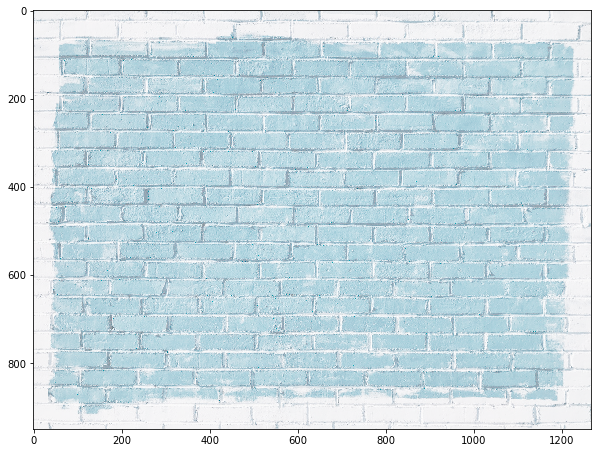

In [13]:
result=np.power(brick_img,gamma)
display_img(result)

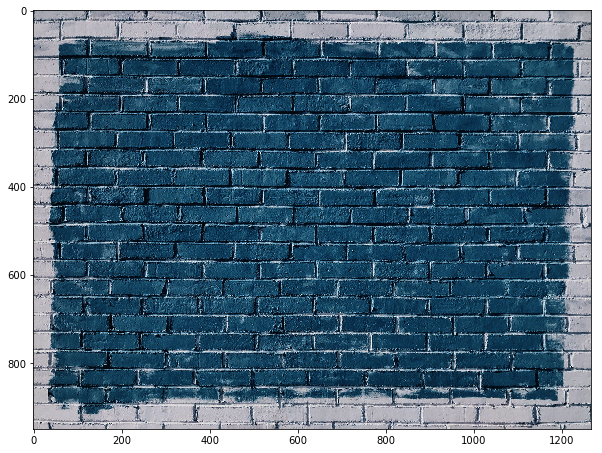

In [15]:
img=load_img()
gamma=2
result=np.power(img,gamma)
display_img(result)

### Low pass filter with 2D convolution
A fitlering operation known as 2D convolution can be used to create a low-pass filter. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


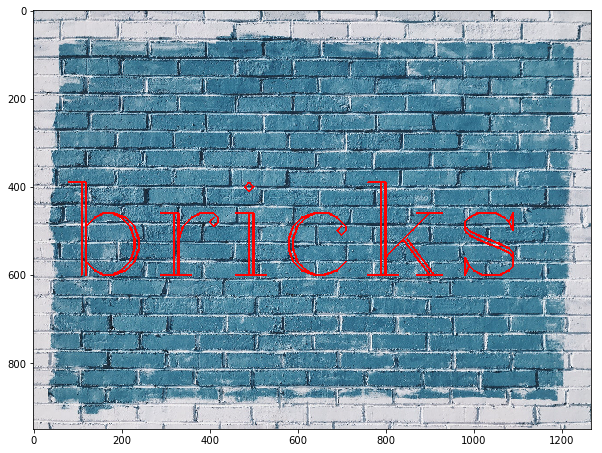

In [19]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="bricks",fontFace=font,org=(60,600),fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

In [20]:
kernel=np.ones(shape=(5,5),dtype=np.float32)/25

In [21]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


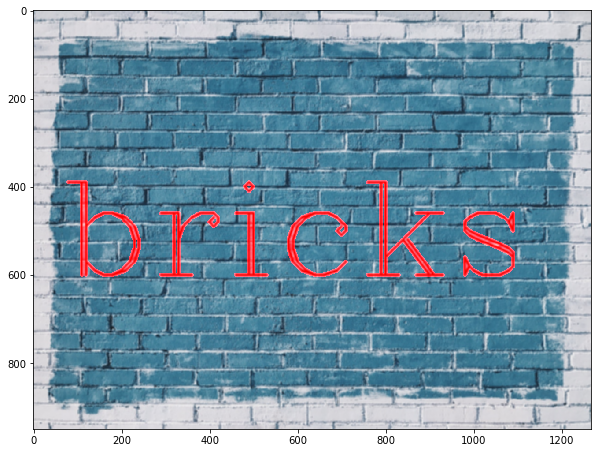

In [22]:
dst=cv2.filter2D(img,-1,kernel)
display_img(dst)

### Averaging

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


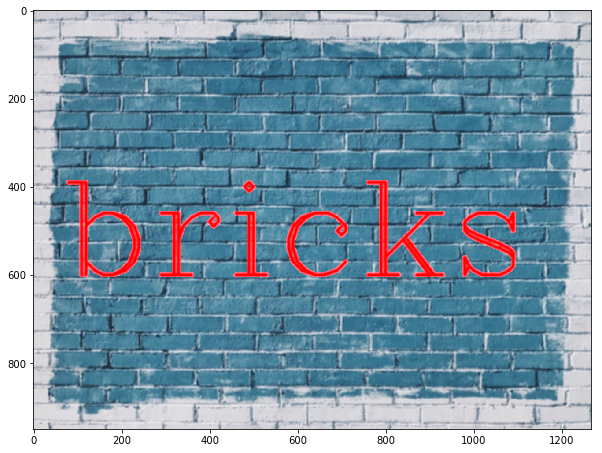

In [24]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
img=cv2.putText(img,text="bricks",fontFace=font,fontScale=10,org=(60,600),thickness=5,color=(255,0,0))
blurred_img=cv2.blur(img,ksize=(5,5))
display_img(blurred_img)


### Gaussian Blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


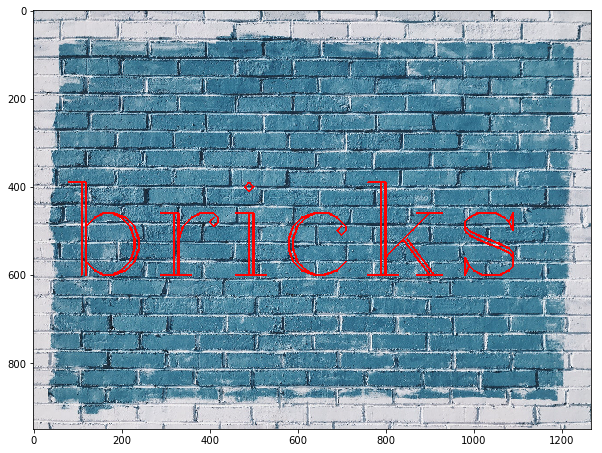

In [27]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
img=cv2.putText(img,text="bricks",fontFace=font,fontScale=10,org=(60,600),thickness=4,color=(255,0,0))
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


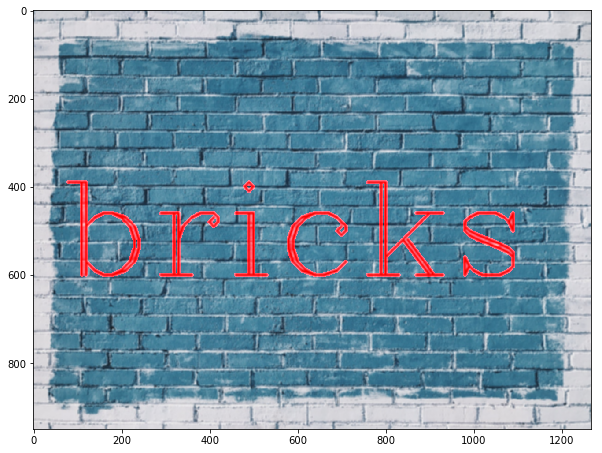

In [28]:
blurred_img=cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

### Medain Blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


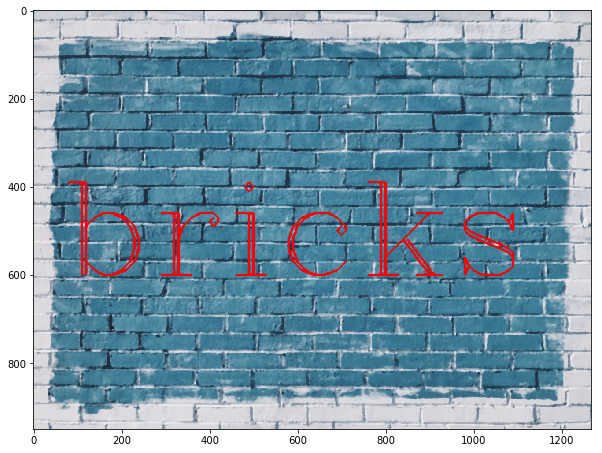

In [29]:
median_img=cv2.medianBlur(img,5)
display_img(median_img)

### Adding Noise 
adding noise to our image to understand better how blurring is useful for us.

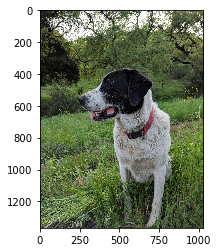

In [31]:
img=cv2.imread('sammy.jpg')
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)

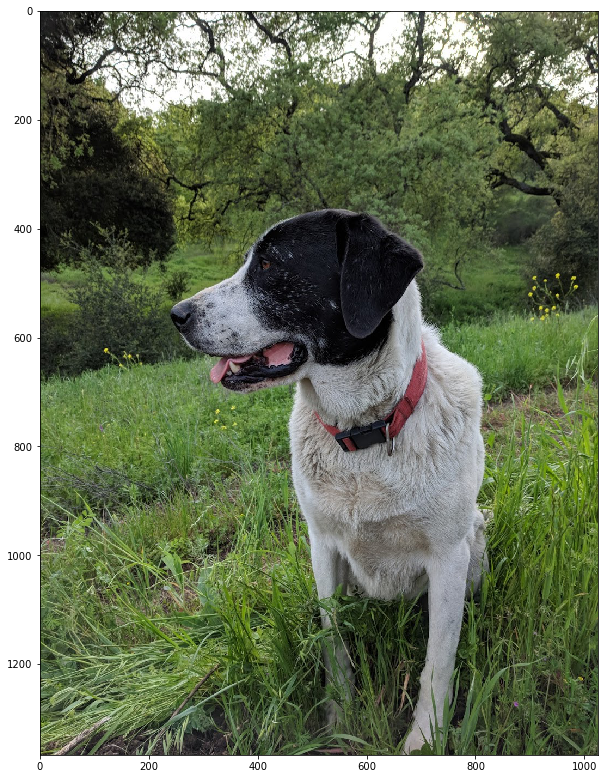

In [34]:
display_img(img)

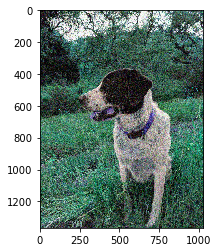

In [35]:
# import noise image
noise_img=cv2.imread('sammy_noise.jpg')
noise_img=cv2.cvtColor(noise_img,cv2.COLOR_BGR2RGB)
plt.imshow(noise_img)

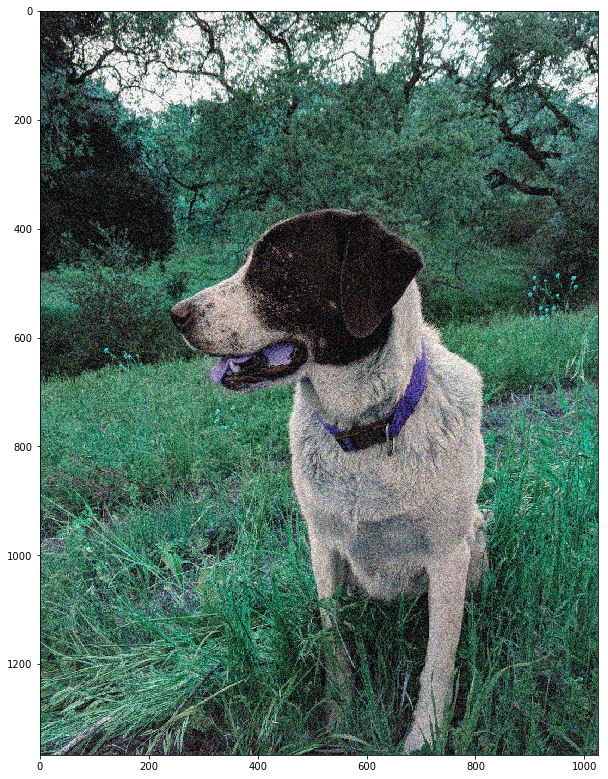

In [36]:
display_img(noise_img)

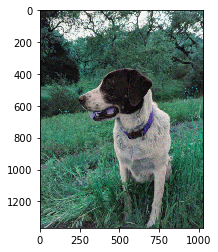

In [37]:
img_median=cv2.medianBlur(noise_img,5)
plt.imshow(img_median)

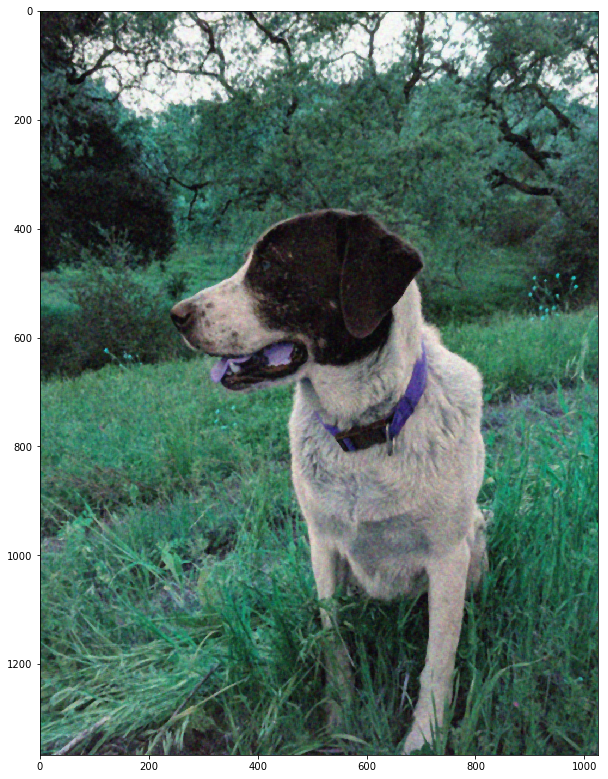

In [38]:
display_img(img_median)

### Bilateral Filtering
cv.bilateralFilter() is highly effective in noise removal while keeping edges sharp. But the operation is slower compared to other filters. We already saw that a Gaussian filter takes the neighbourhood around the pixel and finds its Gaussian weighted average. This Gaussian filter is a function of space alone, that is, nearby pixels are considered while filtering. It doesn't consider whether pixels have almost the same intensity. It doesn't consider whether a pixel is an edge pixel or not. So it blurs the edges also, which we don't want to do.

Bilateral filtering also takes a Gaussian filter in space, but one more Gaussian filter which is a function of pixel difference. The Gaussian function of space makes sure that only nearby pixels are considered for blurring, while the Gaussian function of intensity difference makes sure that only those pixels with similar intensities to the central pixel are considered for blurring. So it preserves the edges since pixels at edges will have large intensity variation.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


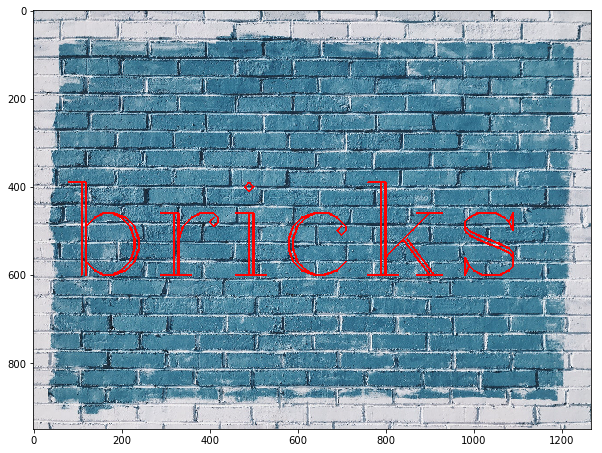

In [44]:
# Import Image 
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
img=cv2.putText(img,text="bricks",org=(60,600),fontFace=font,fontScale=10,thickness=4,color=(255,0,0))
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


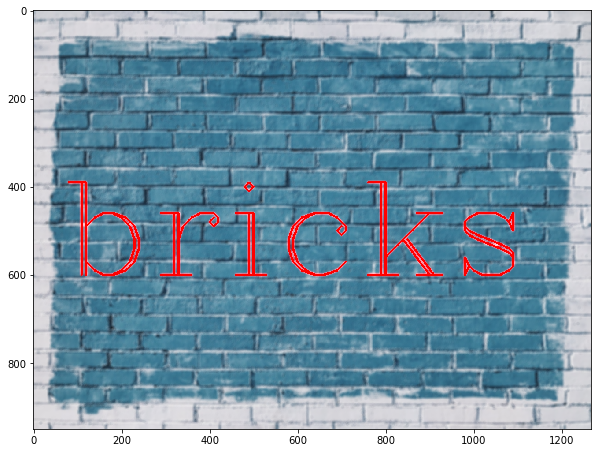

In [45]:
blurred_img=cv2.bilateralFilter(img,9,75,75)
display_img(blurred_img)